<img src='https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcTrXWw8bCPdfU-7SaDF8fQChBdI9iGrblZBXLLb6PmbI07T7XTA'>

<img src='https://miro.medium.com/max/810/0*GHwTTzmpNcBQ004M.png'>

# Table of Contents

## Introduction to Random Forest

- [Pre-requisites: Decision Trees](#Pre-requisites:-Decision-Trees)

- [Why Random Forest?](#school_attendance)
    
- [How it Works?](#school_attendance)
    
- [Advantages and Disadvantages of RF](#school_attendance)

## Random Forest Implementation

### Base Random Forest
- [Fitting on Numerical Features](#correlation)

- [Fitting on Categorical+Numerical Features](#race_economic)

- [Evaluate Scores](#school_attendance)

## Best Practice for Interpreting Random Forest

- [Interpreting Individual Decision Trees](#math_test)
- [Interpreting Feature Importance](#math_test)


## Conclusion

- [Use Cases](#correlation)
- [Questions](#correlation)

# Introduction to Random Forest
***

## Pre-requisites: Decision Trees
***

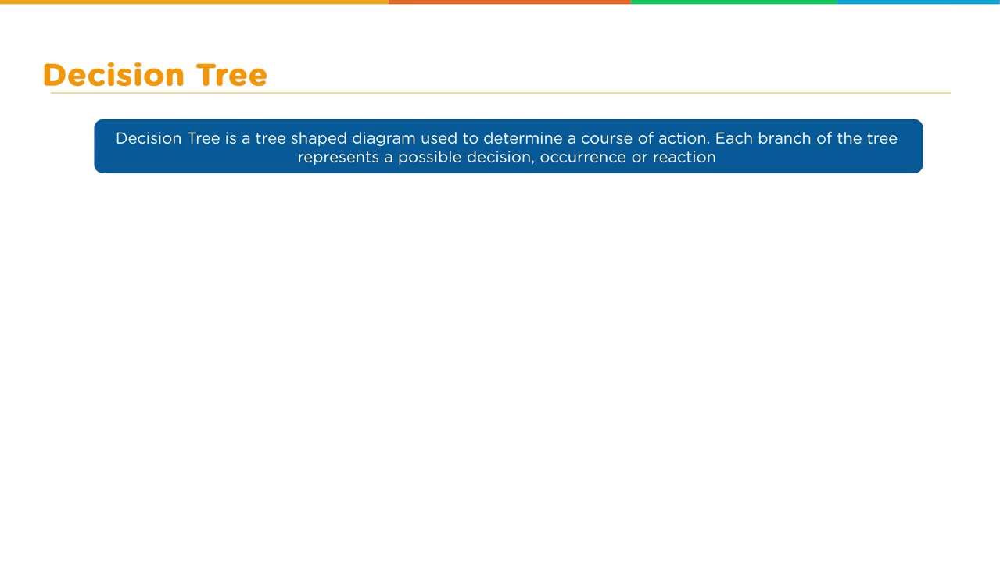

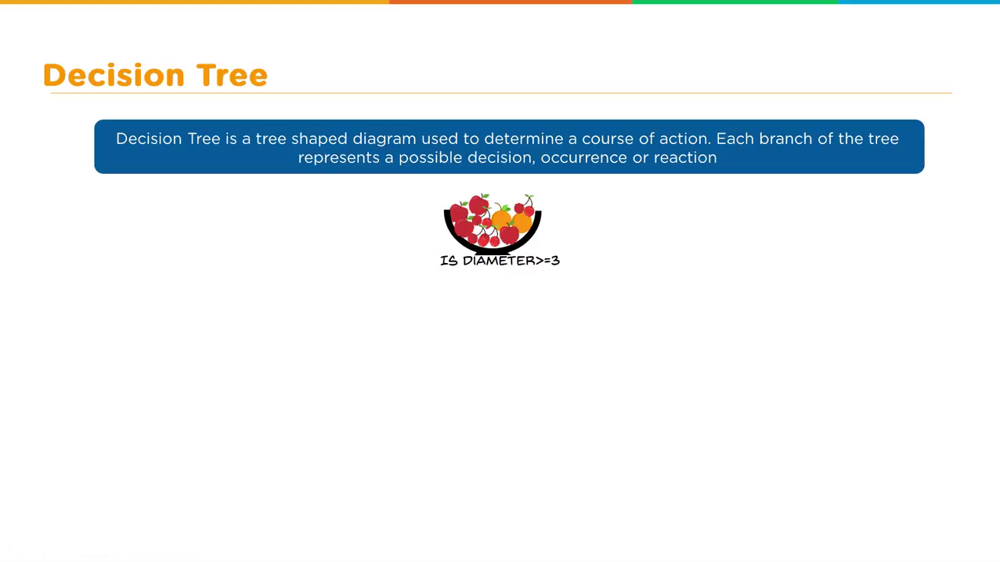

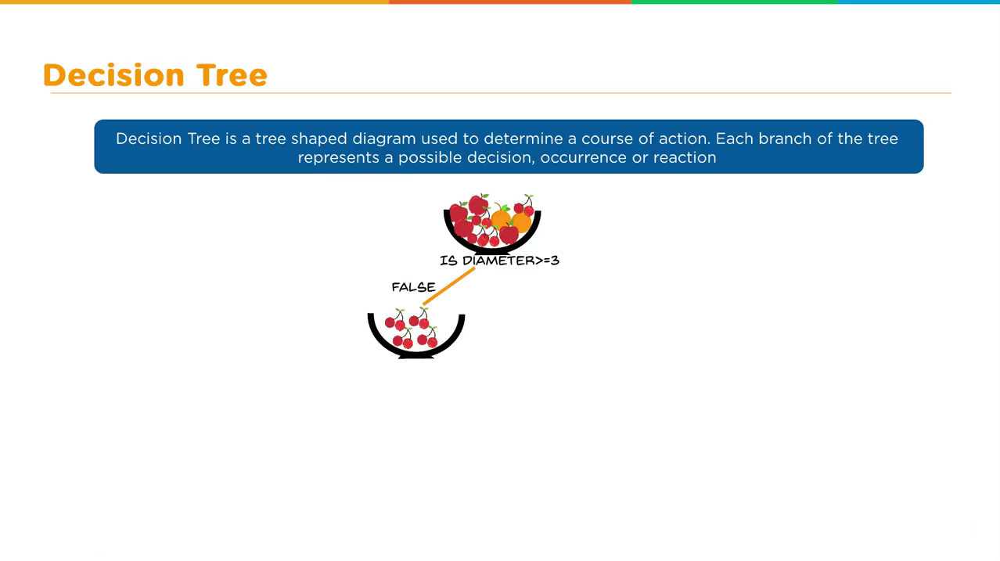

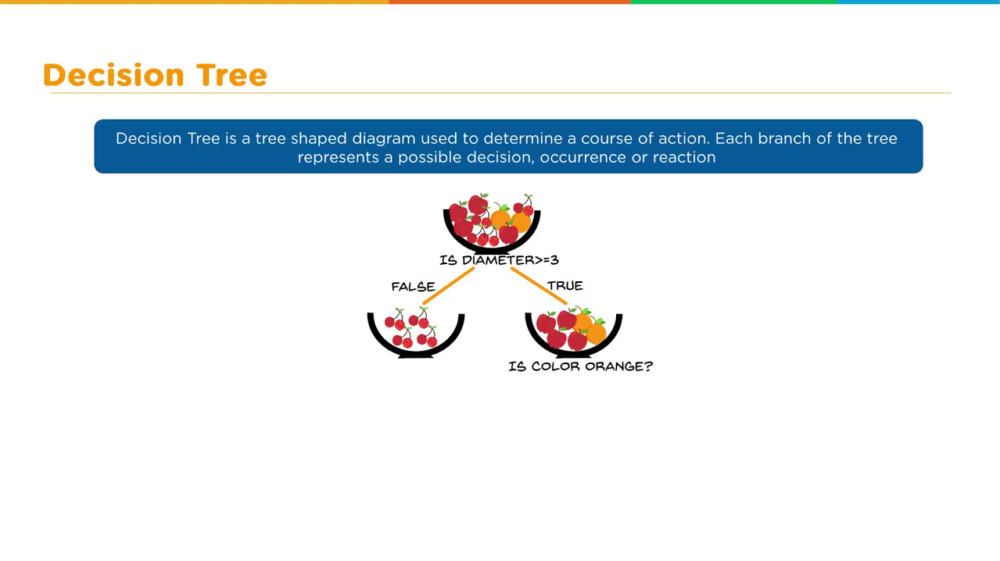

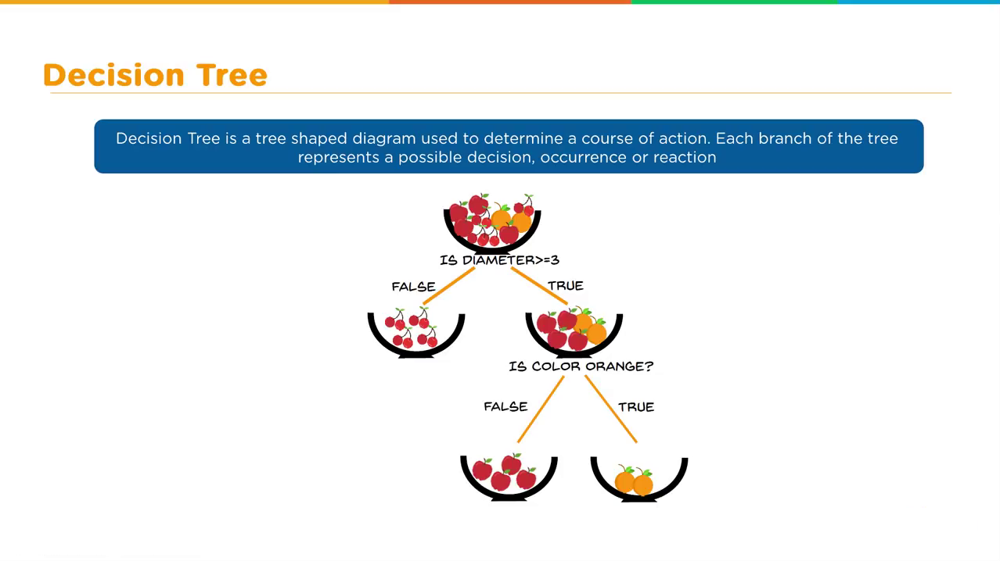

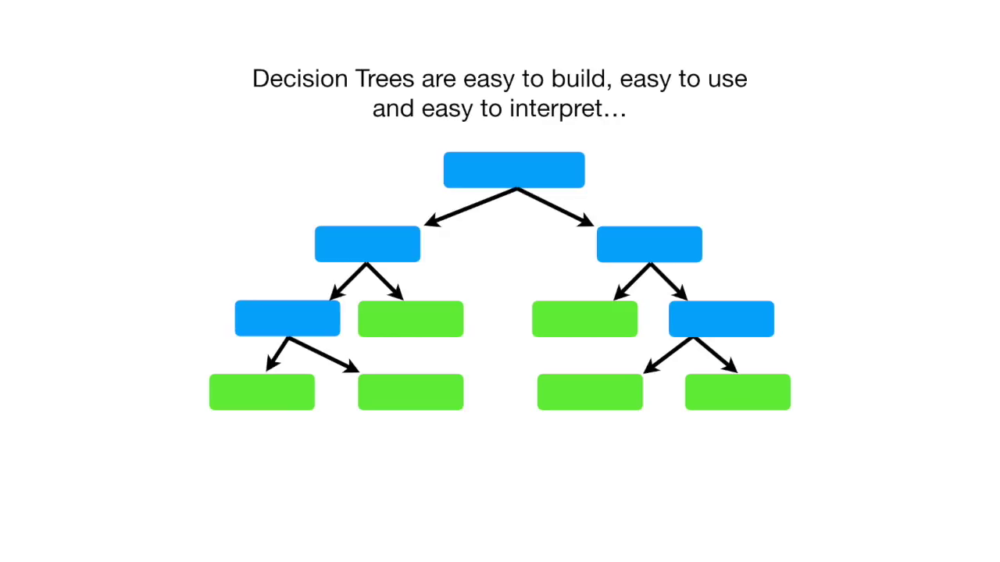

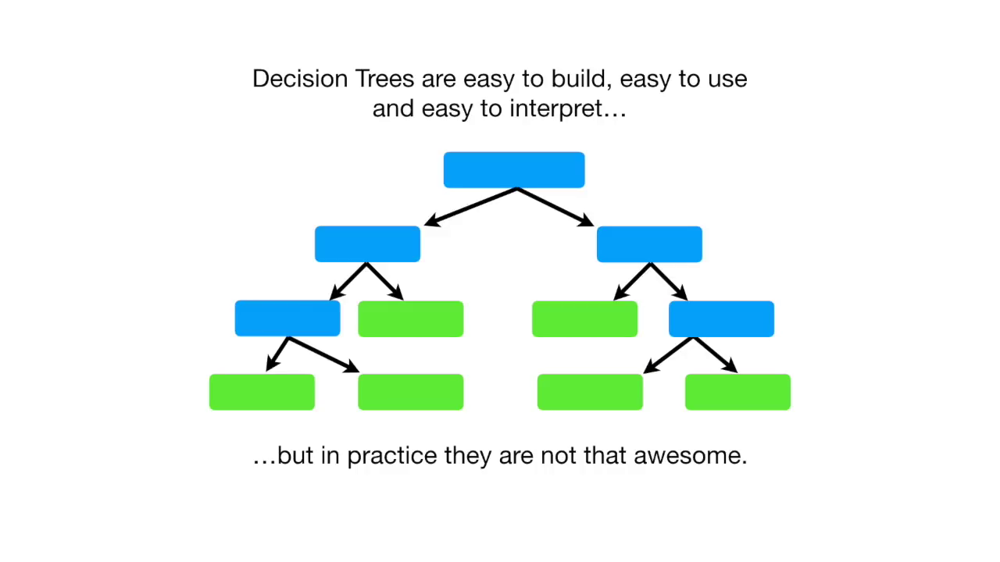

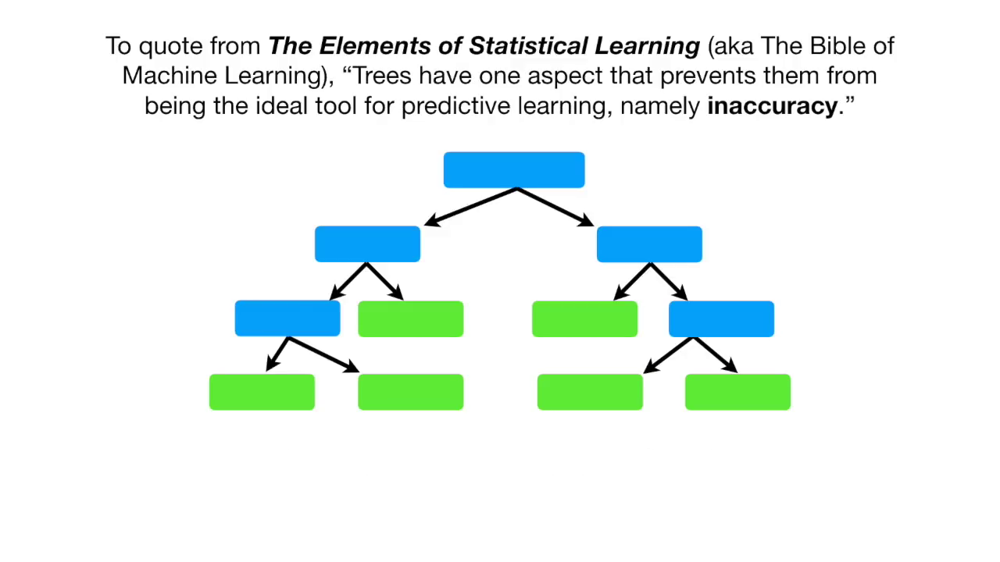

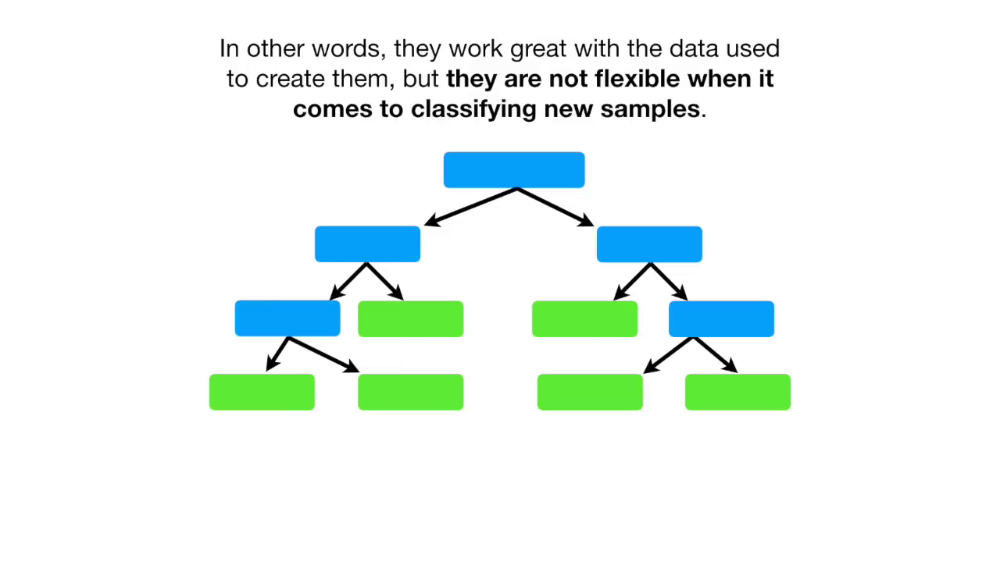

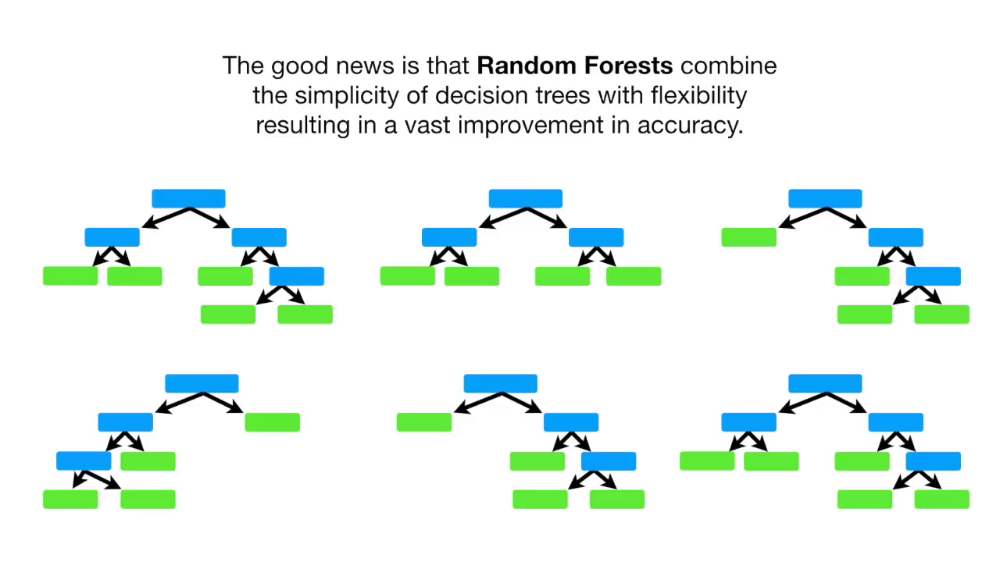

## What is Random Forest?

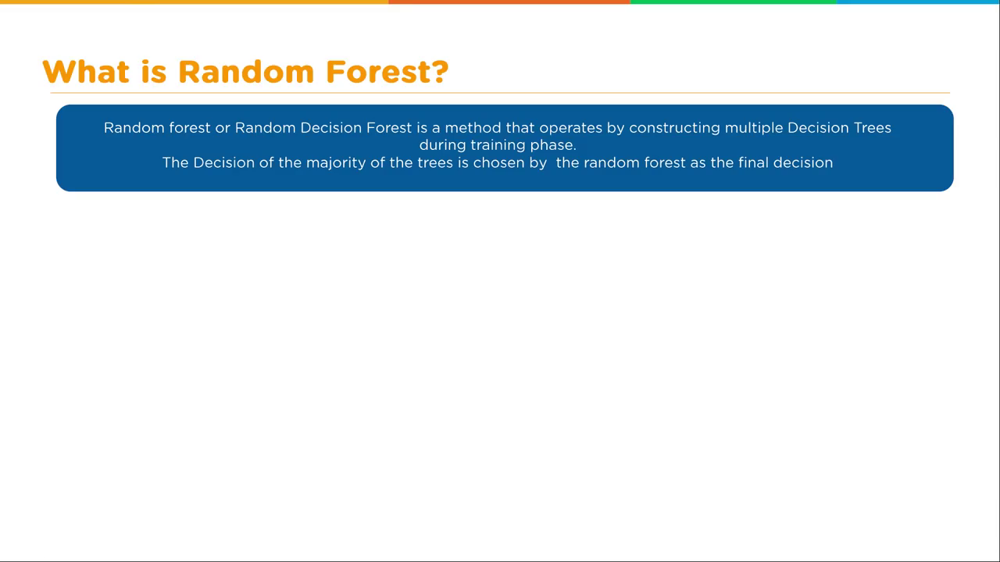

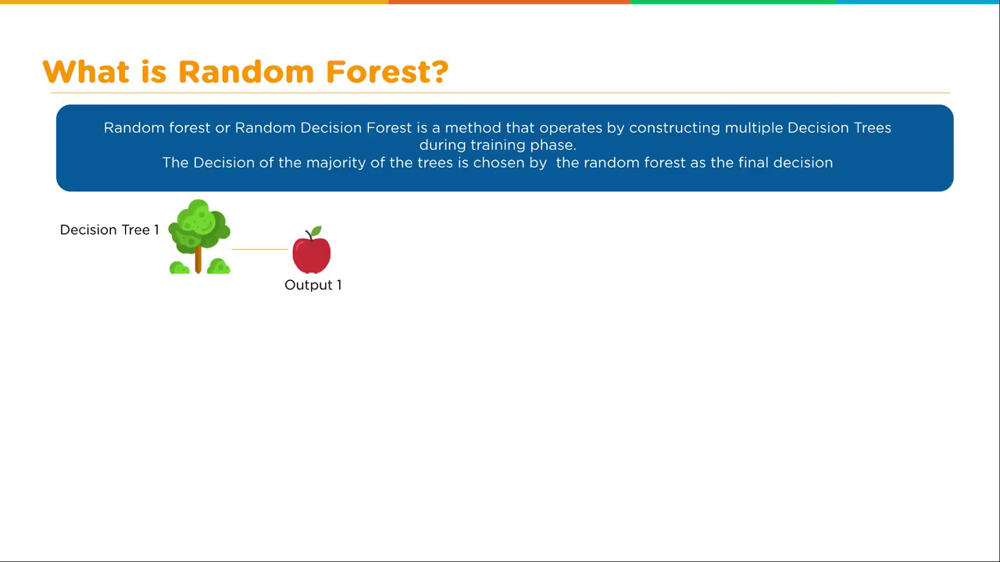

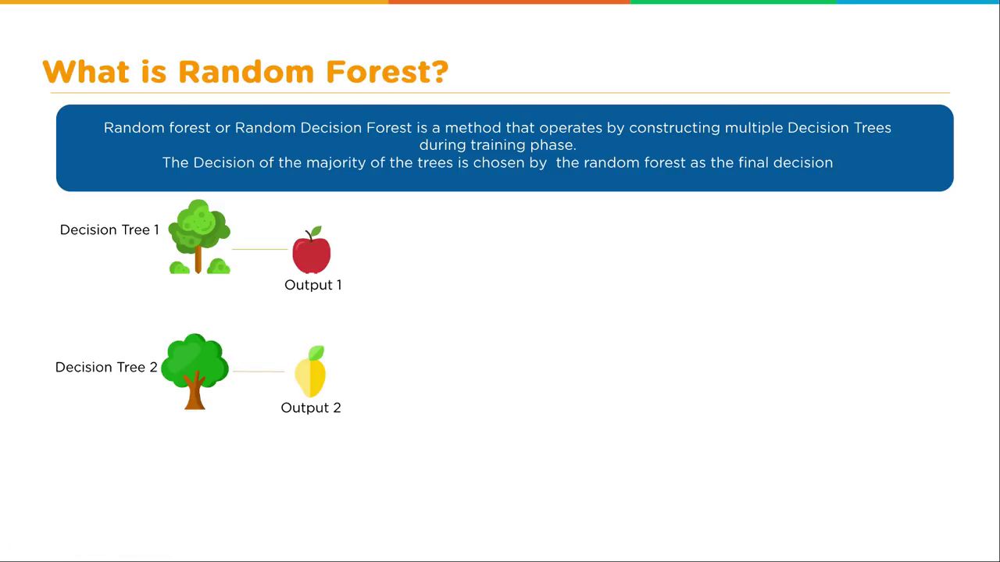

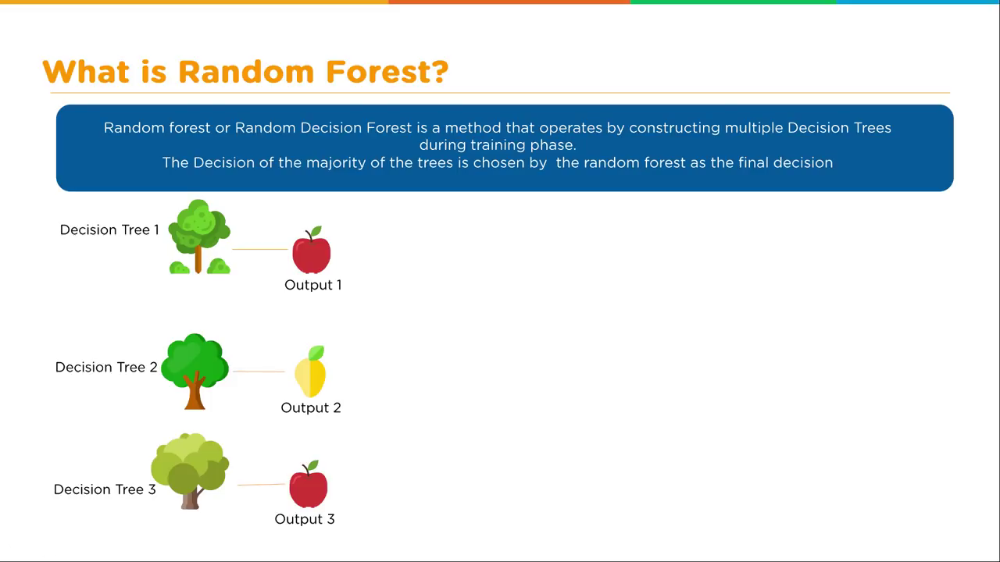

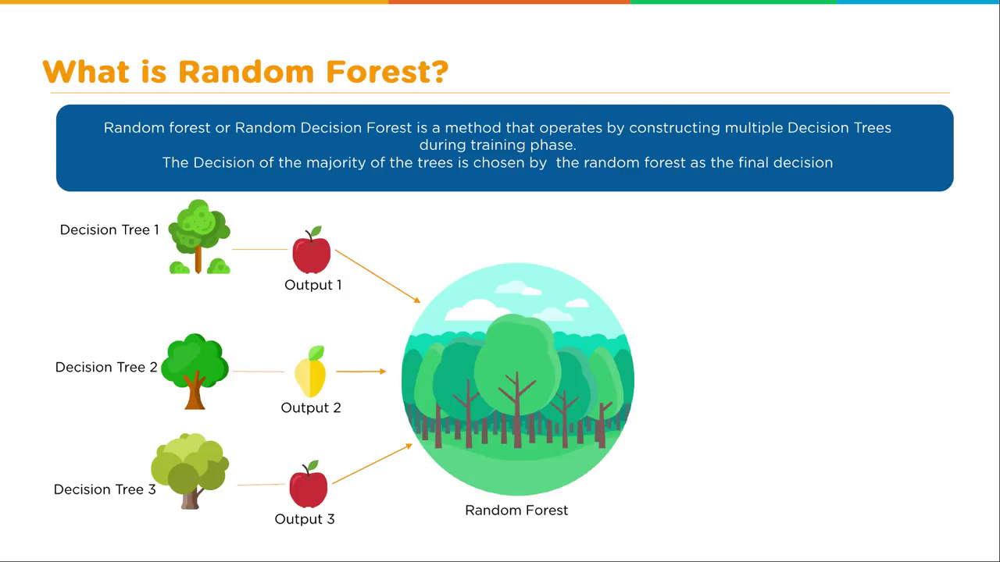

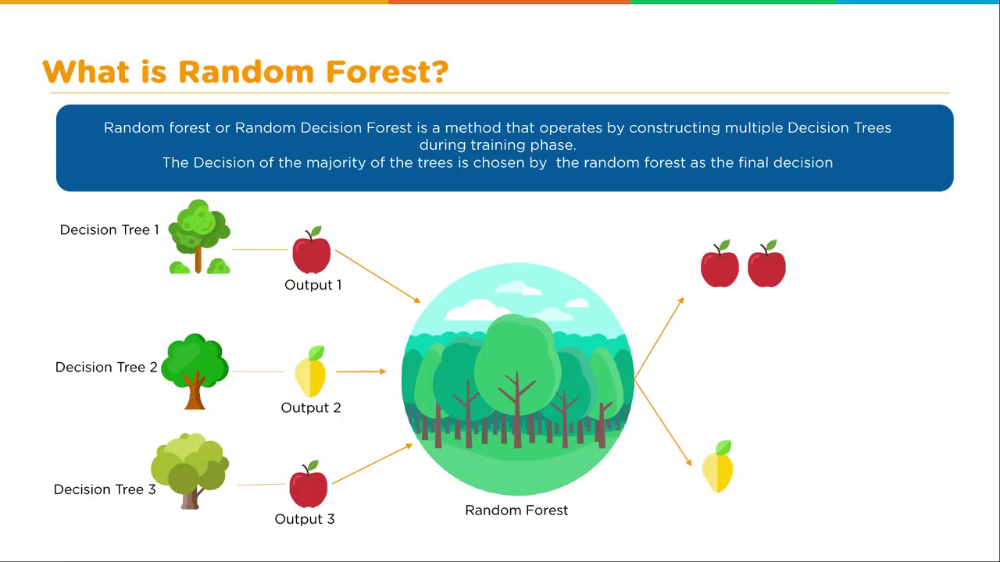

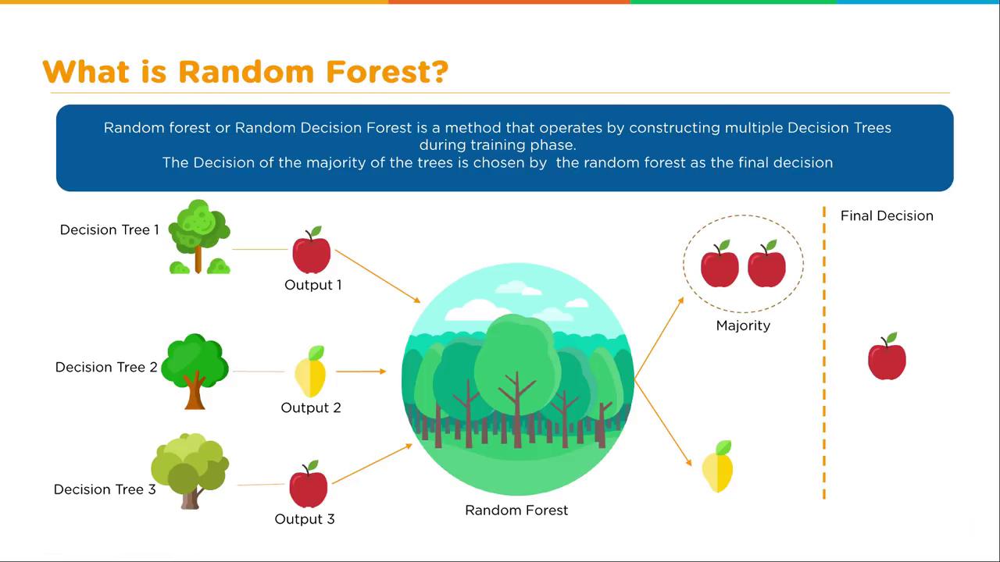

## Why Random Forest?

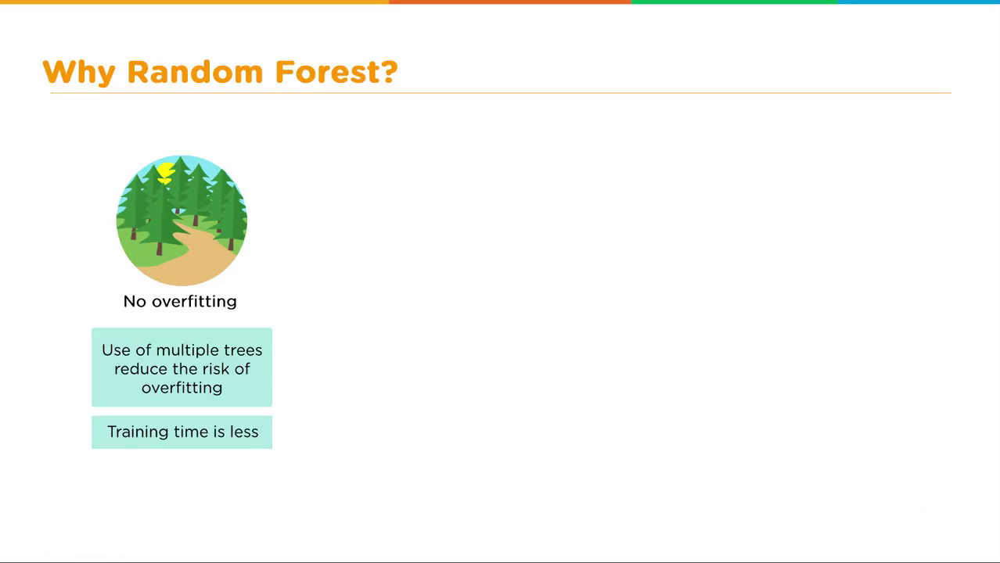

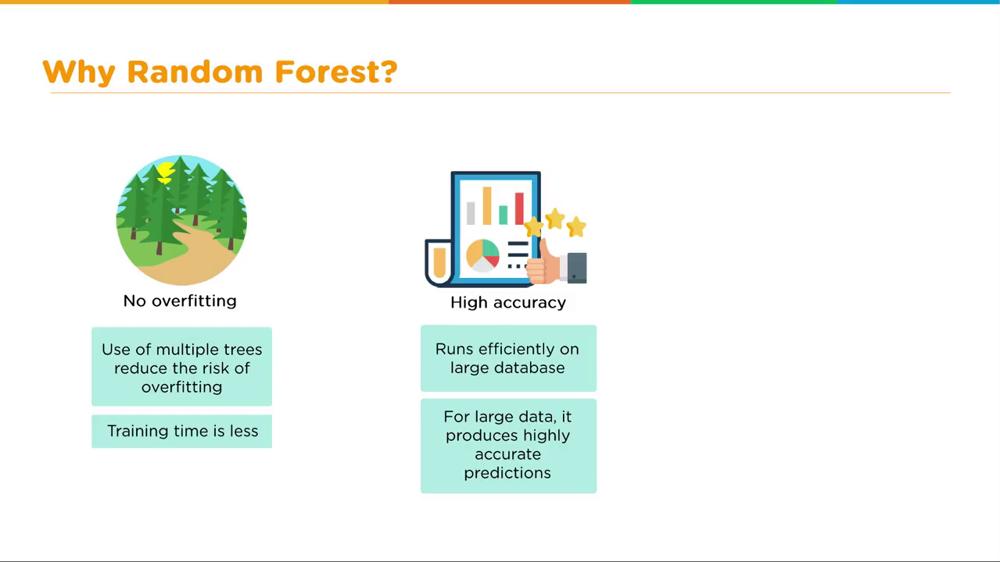

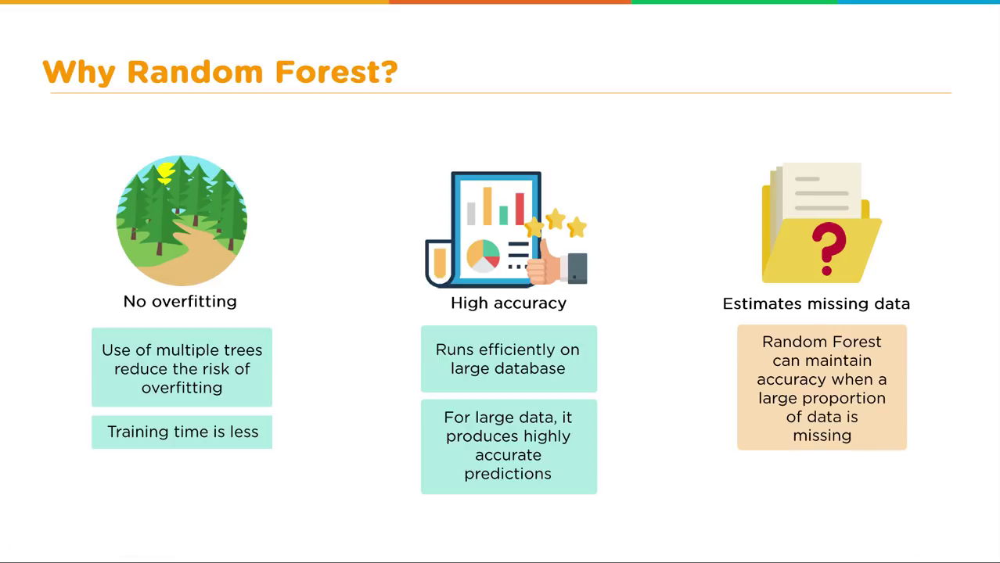

## How Random Forest?

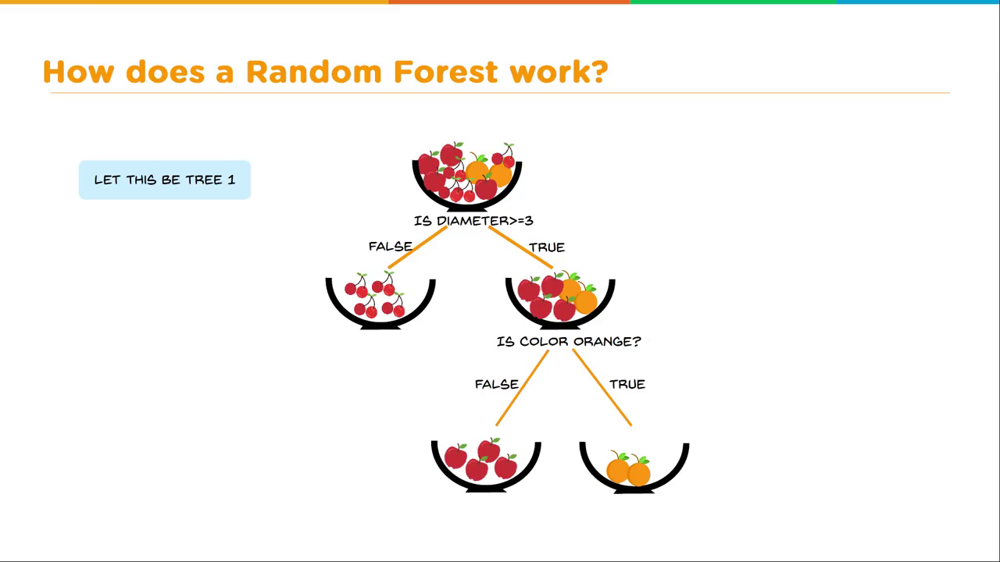

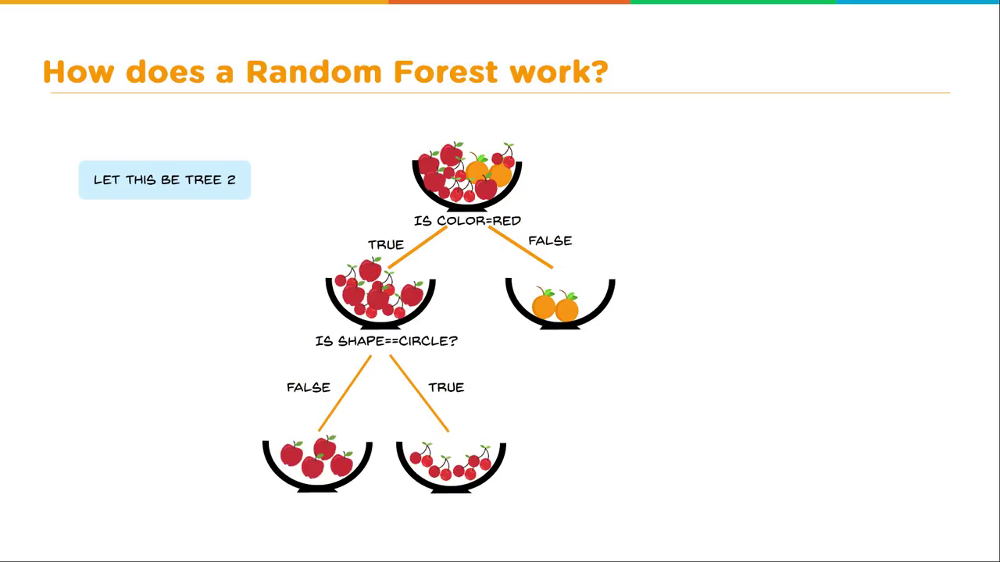

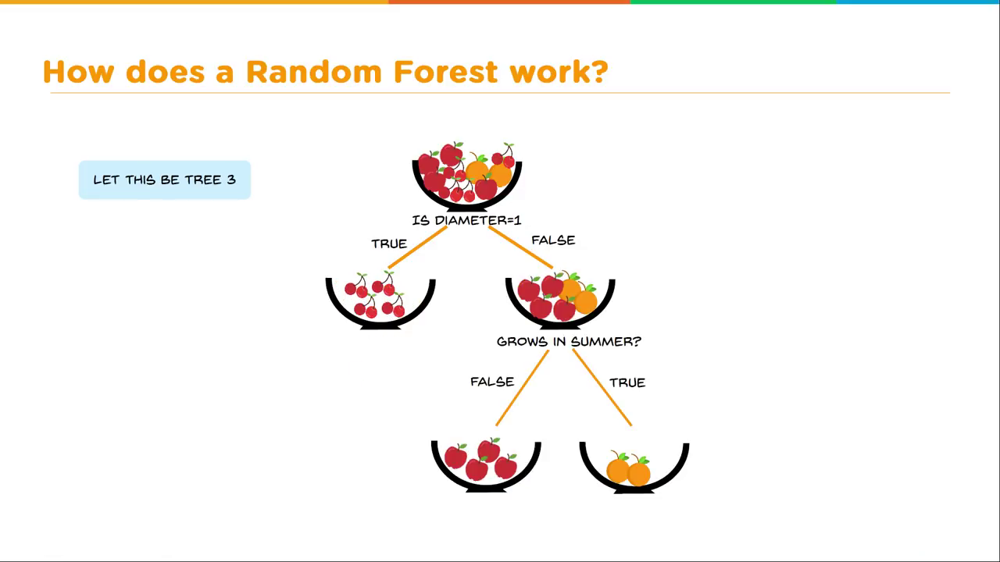

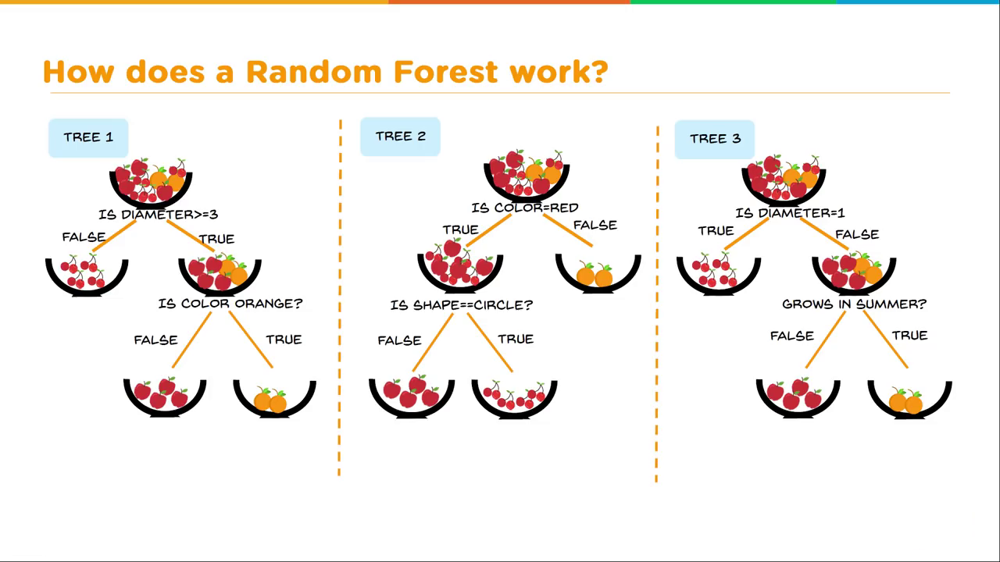

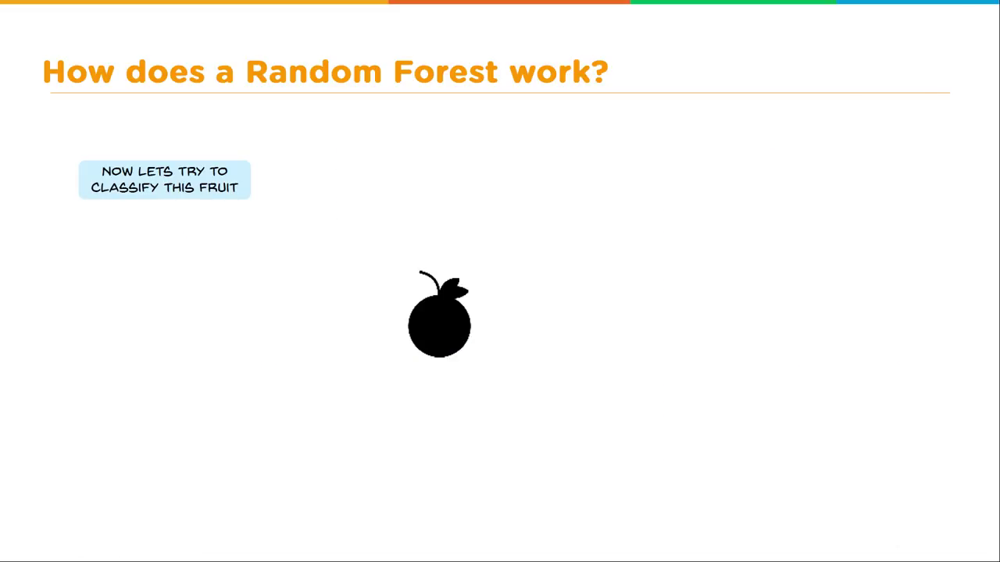

...

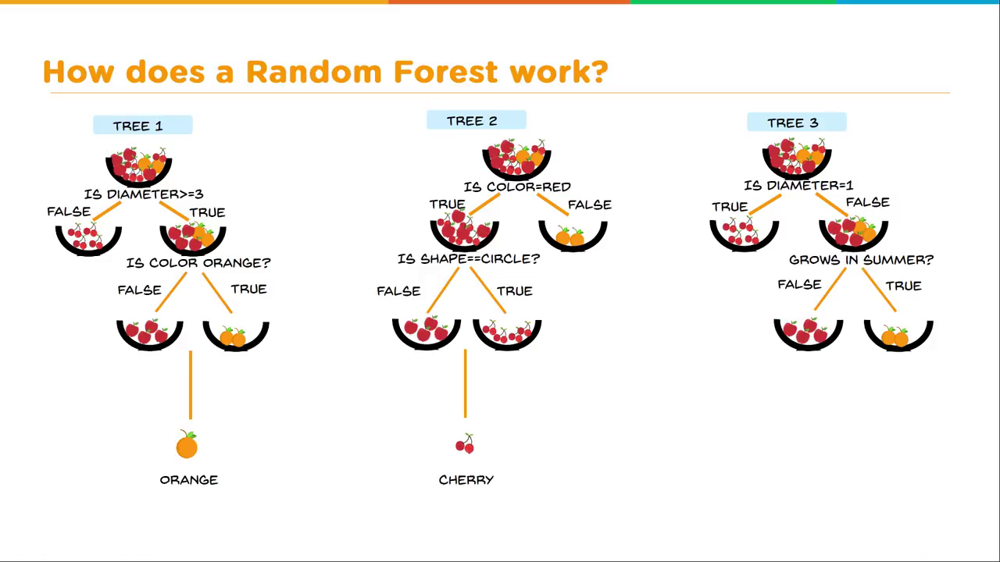

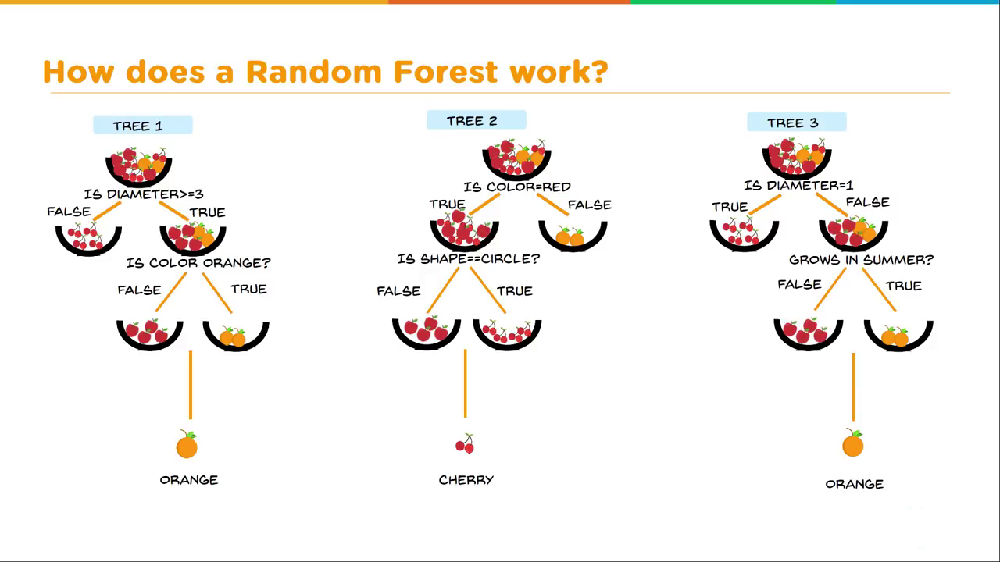

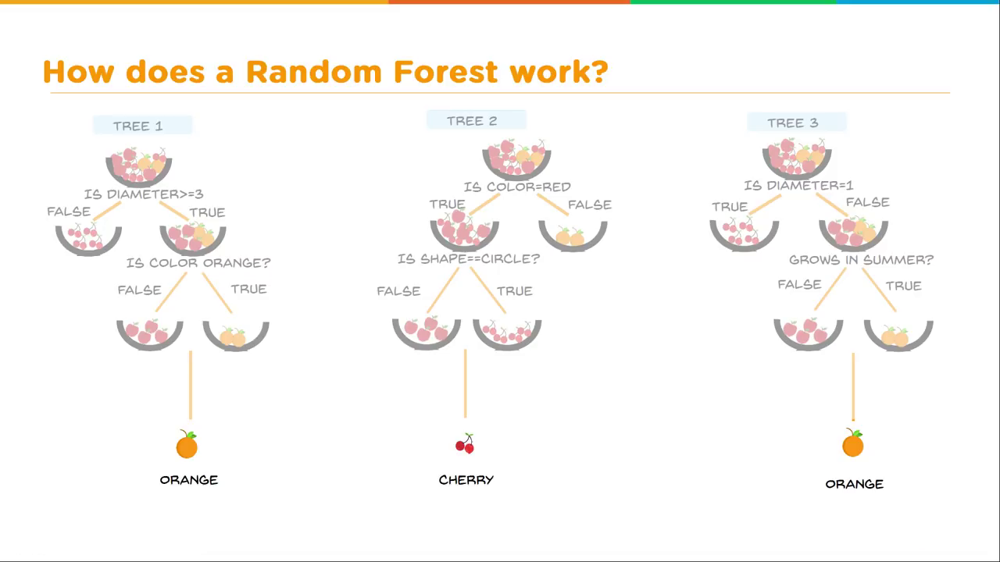

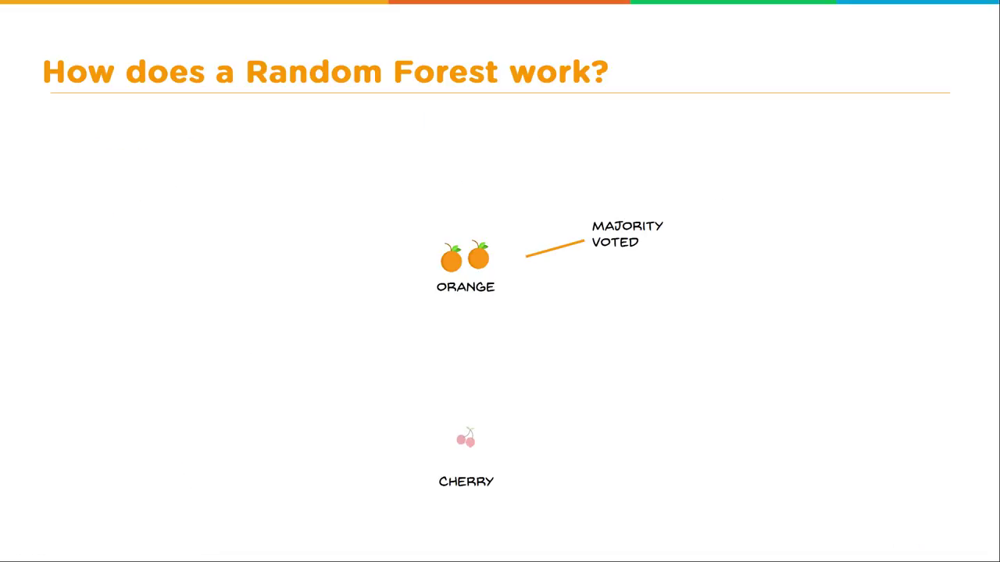

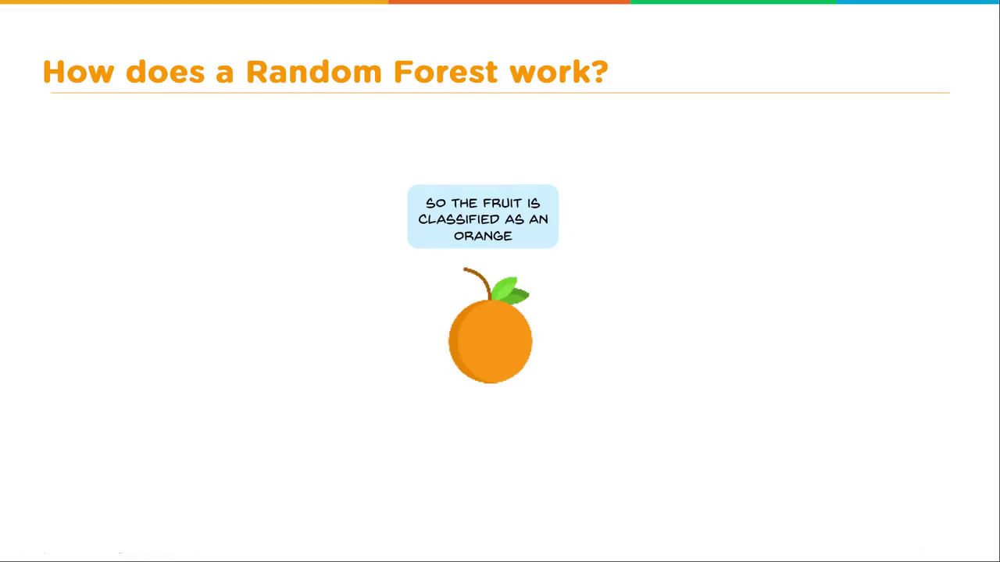

## Benefits of Tree-Based Models

- Works for both classification and regression
- Handles categorical features naturally
- No assumption of distributions
- Can handle non-linear interactions 
- No need for feature scaling / transformation
- Handles missing values in the variables

## Pros & Cons

**Advantages**: 
- Built in cross validation (OOB Scores)
- Built in Feature Selection (implicit)
- Feature importance
- Default hyper parameters are great and Works well "off the shelf"
- Minimum hyper parameter tuning
- RF natively detects interactions 
- It's parametric (you don't have to make any assumptions of your data)

**Disadvantages**:
- RF is a black box (It's literally a function of 1000 decision trees)
- It doesn't tell you "how" the features are important

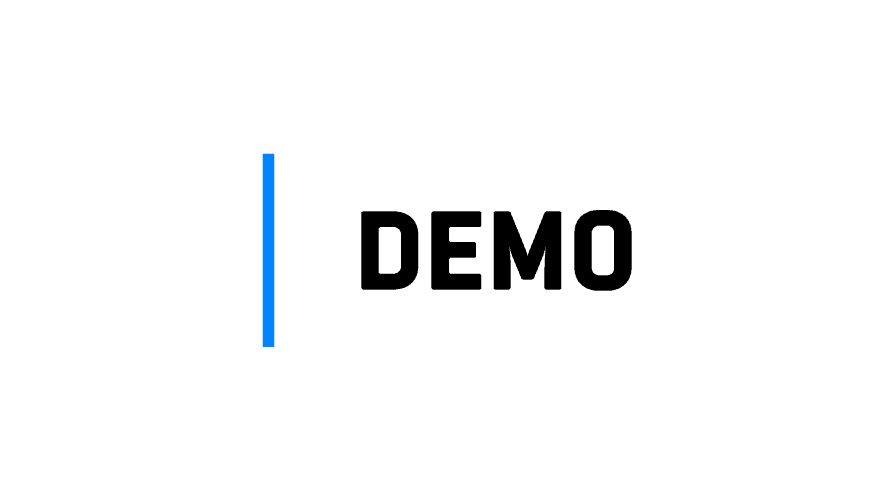

# Random Forest Implementation
***

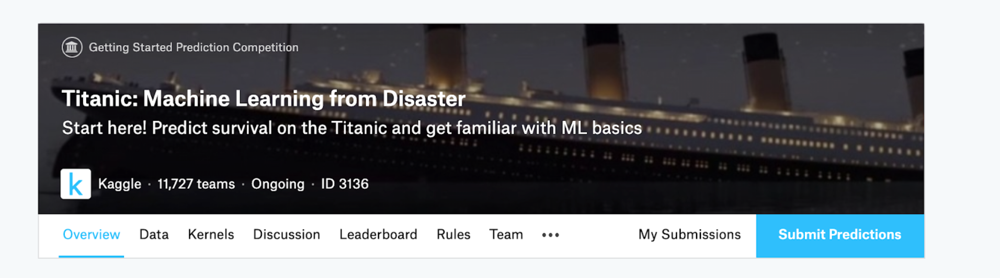

## Import Libraries

In [1]:
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib as matplot
import matplotlib.pyplot as plt

from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import Binarizer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier


%matplotlib inline
warnings.filterwarnings("ignore")

C:\Users\raven\Anaconda3\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm



## Import Titanic Dataset

In [2]:
# Import the Titanic Dataset
X = pd.read_csv('titanic_train.csv')
y = X.pop("Survived")

In [3]:
X.head()

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


### Quick Data Cleaning and Data Imputation

- **Dummified** categorical features (Sex, Cabin, Embarked)

- **Dropped** unimportant features (PassengerId, Name, Ticket)

- **Imputed** missing values in features (Age)

In [4]:
# Drop PassengerId, Name, Ticket
X.drop(['PassengerId','Name','Ticket'], axis=1, inplace=True)

In [5]:
def clean_cabin(x):
    try:
        return x[0]
    except TypeError:
        return "None"

In [6]:
# Clean Cabin
X["Cabin"] = X.Cabin.apply(clean_cabin)

- **Imputed** missing values in features (Age)

In [7]:
# Impute missing age with median
X["Age"].fillna(X["Age"].median(), inplace=True)

- **Dummified** categorical features (Sex, Cabin, Embarked)

In [8]:
# Define categorical features
categorical_variables = ["Sex", "Cabin", "Embarked"]

In [9]:
# Impute missing categorical variables and dummify them
for variable in categorical_variables:
    X[variable].fillna("Missing", inplace=True)
    dummies = pd.get_dummies(X[variable], prefix=variable)
    X = pd.concat([X, dummies], axis=1)
    X.drop([variable], axis=1, inplace=True)

In [10]:
X.head()

,Pclass,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Cabin_A,Cabin_B,Cabin_C,Cabin_D,Cabin_E,Cabin_F,Cabin_G,Cabin_None,Cabin_T,Embarked_C,Embarked_Missing,Embarked_Q,Embarked_S
0,3,22.0,1,0,7.2500,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1
1,1,38.0,1,0,71.2833,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0
2,3,26.0,0,0,7.9250,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1
3,1,35.0,1,0,53.1000,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1
4,3,35.0,0,0,8.0500,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1


### Split into Train & Test Set

In [11]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

# Fitting on Numeric Features

In [12]:
# Get a list of numerical features
numeric_variables = ['Pclass','Age','SibSp','Parch','Fare']
X_numeric = X_train[numeric_variables]
X_numeric.head()

,Pclass,Age,SibSp,Parch,Fare
331,1,45.5,0,0,28.5000
733,2,23.0,0,0,13.0000
382,3,32.0,0,0,7.9250
704,3,26.0,1,0,7.8542
813,3,6.0,4,2,31.2750


In [13]:
# Create the baseline 
model_1 = RandomForestClassifier(oob_score=True, random_state=42)

### Out-of-Bag Score (Built in Cross Validation) 

In [14]:
# Fit and Evaluate OOB
model_1 = model_1.fit(X_numeric, y_train)

# Calculate OOB Score
print("The OOB Score is: " + str(model_1.oob_score_))

The OOB Score is: 0.6544943820224719


### Cross Validation Score

In [15]:
rf_result = cross_val_score(model_1, X_numeric, y_train, scoring='accuracy')
rf_result.mean()

0.6601129903438169

### AUC Score

In [16]:
# AUC Score
pred_train = np.argmax(model_1.oob_decision_function_,axis=1)
rf_numeric_auc = roc_auc_score(y_train, pred_train)
rf_numeric_auc

0.613520236654565

# Fitting on Categorical and Numerical Features

### Copy original training set

In [17]:
# Copy the whole train set
X_cat = X_train.copy()

In [18]:
X_cat.head(3)

,Pclass,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Cabin_A,Cabin_B,Cabin_C,Cabin_D,Cabin_E,Cabin_F,Cabin_G,Cabin_None,Cabin_T,Embarked_C,Embarked_Missing,Embarked_Q,Embarked_S
331,1,45.5,0,0,28.500,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1
733,2,23.0,0,0,13.000,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1
382,3,32.0,0,0,7.925,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1


In [19]:
# Create the baseline 
model_2 = RandomForestClassifier(oob_score=True, random_state=40)

### Out-of-Bag Score (Built in Cross Validation) 

In [20]:
# Fit and Evaluate OOB
model_2 = model_2.fit(X_cat, y_train)

# Calculate OOB Score
print("The OOB Score is: " + str(model_2.oob_score_))

The OOB Score is: 0.7963483146067416


### Cross Validation Score

In [21]:
rf_result = cross_val_score(model_2, X_cat, y_train, scoring='accuracy')
rf_result.mean()

0.7837227718091455

### AUC Score

In [22]:
# AUC Score
pred_train = np.argmax(model_2.oob_decision_function_,axis=1)
rf_cat_auc = roc_auc_score(y_train, pred_train)
rf_cat_auc

0.7694130697862042

### Feature Scaling?

Does Scaling Affect Performance? Is it neccessary for tree based models?

In [23]:
X_cat_scaled = StandardScaler().fit(X_cat).transform(X_cat)
X_cat_scaled

array([[-1.61413602,  1.25364106, -0.47072241, ..., -0.05307449,
        -0.30335547,  0.59681695],
       [-0.40055118, -0.47728355, -0.47072241, ..., -0.05307449,
        -0.30335547,  0.59681695],
       [ 0.81303367,  0.21508629, -0.47072241, ..., -0.05307449,
        -0.30335547,  0.59681695],
       ...,
       [ 0.81303367,  0.90745614,  1.23056874, ..., -0.05307449,
        -0.30335547,  0.59681695],
       [-1.61413602, -1.1696534 ,  0.37992316, ..., -0.05307449,
        -0.30335547,  0.59681695],
       [-1.61413602, -0.63114352, -0.47072241, ..., -0.05307449,
        -0.30335547,  0.59681695]])

### Fit Standardized Training Set

In [24]:
# Create the baseline 
model_3= RandomForestClassifier(oob_score=True, random_state=40)

# Fit and Evaluate OOB
model_3 = model_3.fit(X_cat_scaled, y_train)

# Calculate OOB Score
model_3.oob_score_

0.7949438202247191

# Evaluate Scores

## Baseline RF Model Evaluation (ROC AUC)

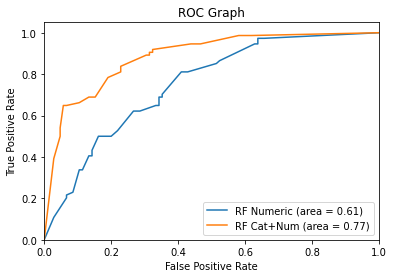

In [25]:
# Create ROC Graph
from sklearn.metrics import roc_curve
rf_numeric_fpr, rf_numeric_tpr, rf_numeric_thresholds = roc_curve(y_test, model_1.predict_proba(X_test[X_numeric.columns])[:,1])
rf_cat_fpr, rf_cat_tpr, rf_cat_thresholds = roc_curve(y_test, model_2.predict_proba(X_test)[:,1])

# Plot Random Forest Numeric ROC
plt.plot(rf_numeric_fpr, rf_numeric_tpr, label='RF Numeric (area = %0.2f)' % rf_numeric_auc)

# Plot Random Forest Cat+Numeric ROC
plt.plot(rf_cat_fpr, rf_cat_tpr, label='RF Cat+Num (area = %0.2f)' % rf_cat_auc)


plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Graph')
plt.legend(loc="lower right")
plt.show();

# Important Parameters 
***
### Parameters that will make your model better
- **max_depth:** The depth size of a tree
- **n_estimators:** The number of trees in the forest. Generally, the more trees the better accuracy, but slower computation.
- **max_features**: The max number of features that the algorithm can assign to an individual tree. Try ['auto', 'None', 'sqrt', 'log2', 0.9 and 0.2]
- **min_samples_leaf:** The minimum number of samples in newly created leaves. Try [1,2,3]. If 3 is best, try higher numbers.

### Parameters that will make your model faster
- **n_jobs**: Determines the amount of multiple processors should be used to train/test the model. Always use -1 to use max cores and it'll run much faster
- **random_state**: Set this to a number (42) for reproducibility. It's used to replicate your results and for others as well.
- **oob_score** Random Forest's custom validation method: out-of-bag prediction

### max_depth

The more depth (deeper the tree) means the higher chance of overfitting

In [26]:
results  =  []
results2 = []
max_depth_size  = [1,2,3,4,5,10,20,50,100]

In [27]:
for depth in max_depth_size:
    model = RandomForestClassifier(depth, oob_score=True, n_jobs=-1, random_state=44)
    #model.fit(X, y)
    model.fit(X_train, y_train)
    print(depth, 'depth')
    pred = model.predict(X_train)
    pred2 = model.predict(X_test)
    roc1 = roc_auc_score(y_train, pred)
    roc2 = roc_auc_score(y_test, pred2)
    print('AUC Train: ', roc1)
    print('AUC Test: ', roc2)
    results.append(roc1)
    results2.append(roc2)
    print (" ")

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1, n_jobs=-1,
                       oob_score=True, random_state=44, verbose=0,
                       warm_start=False)

1 depth
AUC Train:  0.8967997848594863
AUC Test:  0.7148005148005149
 


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=2, n_jobs=-1,
                       oob_score=True, random_state=44, verbose=0,
                       warm_start=False)

2 depth
AUC Train:  0.8932029043969343
AUC Test:  0.725868725868726
 


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=3, n_jobs=-1,
                       oob_score=True, random_state=44, verbose=0,
                       warm_start=False)

3 depth
AUC Train:  0.9289363990856528
AUC Test:  0.8021879021879021
 


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=4, n_jobs=-1,
                       oob_score=True, random_state=44, verbose=0,
                       warm_start=False)

4 depth
AUC Train:  0.9364999327685894
AUC Test:  0.7866795366795367
 


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=5, n_jobs=-1,
                       oob_score=True, random_state=44, verbose=0,
                       warm_start=False)

5 depth
AUC Train:  0.9539969073551162
AUC Test:  0.7906692406692406
 


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=-1,
                       oob_score=True, random_state=44, verbose=0,
                       warm_start=False)

10 depth
AUC Train:  0.9645186231007127
AUC Test:  0.783912483912484
 


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=20, n_jobs=-1,
                       oob_score=True, random_state=44, verbose=0,
                       warm_start=False)

20 depth
AUC Train:  0.9719813096678769
AUC Test:  0.7954311454311453
 


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=50, n_jobs=-1,
                       oob_score=True, random_state=44, verbose=0,
                       warm_start=False)

50 depth
AUC Train:  0.9790910313298373
AUC Test:  0.7791505791505791
 


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=True, random_state=44, verbose=0,
                       warm_start=False)

100 depth
AUC Train:  0.9805701223611671
AUC Test:  0.7656370656370656
 


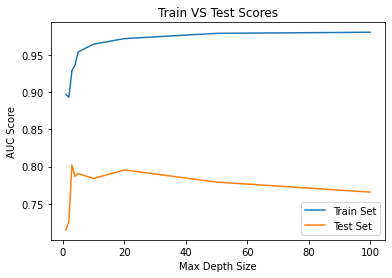

In [28]:
plt.plot(max_depth_size, results, label='Train Set')
plt.plot(max_depth_size, results2, label='Test Set')
plt.xlabel('Max Depth Size')
plt.ylabel('AUC Score')
plt.title('Train VS Test Scores')
plt.legend(loc="lower right")
plt.show();

### n_estimators

Generally the more trees the better. You'll generalize better with more trees and reduce the variance more. The only downside is computation time.

In [29]:
results = []
n_estimator_options = [1, 2, 3, 4, 5, 15, 20, 25, 40, 50, 70, 100]

In [30]:
for trees in n_estimator_options:
    model = RandomForestClassifier(trees, oob_score=True, random_state=42)
    #model.fit(X, y)
    model.fit(X_train, y_train)
    print(trees, 'trees')
    AUC = model.oob_score_
    print('AUC: ', AUC)
    results.append(AUC)
    print (" ")
    

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1,
                       n_jobs=None, oob_score=True, random_state=42, verbose=0,
                       warm_start=False)

1 trees
AUC:  0.6643258426966292
 


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=2,
                       n_jobs=None, oob_score=True, random_state=42, verbose=0,
                       warm_start=False)

2 trees
AUC:  0.6867977528089888
 


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=3,
                       n_jobs=None, oob_score=True, random_state=42, verbose=0,
                       warm_start=False)

3 trees
AUC:  0.7289325842696629
 


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=4,
                       n_jobs=None, oob_score=True, random_state=42, verbose=0,
                       warm_start=False)

4 trees
AUC:  0.7514044943820225
 


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=5,
                       n_jobs=None, oob_score=True, random_state=42, verbose=0,
                       warm_start=False)

5 trees
AUC:  0.7556179775280899
 


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=15,
                       n_jobs=None, oob_score=True, random_state=42, verbose=0,
                       warm_start=False)

15 trees
AUC:  0.7893258426966292
 


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=20,
                       n_jobs=None, oob_score=True, random_state=42, verbose=0,
                       warm_start=False)

20 trees
AUC:  0.7963483146067416
 


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=25,
                       n_jobs=None, oob_score=True, random_state=42, verbose=0,
                       warm_start=False)

25 trees
AUC:  0.7935393258426966
 


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=40,
                       n_jobs=None, oob_score=True, random_state=42, verbose=0,
                       warm_start=False)

40 trees
AUC:  0.797752808988764
 


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=50,
                       n_jobs=None, oob_score=True, random_state=42, verbose=0,
                       warm_start=False)

50 trees
AUC:  0.7963483146067416
 


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=70,
                       n_jobs=None, oob_score=True, random_state=42, verbose=0,
                       warm_start=False)

70 trees
AUC:  0.797752808988764
 


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=True, random_state=42, verbose=0,
                       warm_start=False)

100 trees
AUC:  0.7991573033707865
 


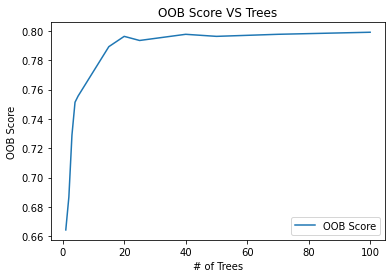

In [31]:
plt.plot(n_estimator_options, results, label='OOB Score')
plt.xlabel('# of Trees')
plt.ylabel('OOB Score')
plt.title('OOB Score VS Trees')
plt.legend(loc="lower right")
plt.show();

### Max Features

In [32]:
results = []
max_features_options = ["auto", None, "sqrt", "log2", 0.7, 0.2]

In [33]:
for max_features in max_features_options:
    model = RandomForestClassifier(n_estimators=1000, oob_score=True, n_jobs=-1, random_state=42, max_features=max_features)
    model.fit(X_train, y_train)
    print(max_features, "option")
    auc = model.oob_score_
    print('AUC: ', auc)
    results.append(auc)
    print (" ")

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1000,
                       n_jobs=-1, oob_score=True, random_state=42, verbose=0,
                       warm_start=False)

auto option
AUC:  0.7991573033707865
 


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1000,
                       n_jobs=-1, oob_score=True, random_state=42, verbose=0,
                       warm_start=False)

None option
AUC:  0.7963483146067416
 


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='sqrt', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1000,
                       n_jobs=-1, oob_score=True, random_state=42, verbose=0,
                       warm_start=False)

sqrt option
AUC:  0.7991573033707865
 


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='log2', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1000,
                       n_jobs=-1, oob_score=True, random_state=42, verbose=0,
                       warm_start=False)

log2 option
AUC:  0.7991573033707865
 


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features=0.7, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1000,
                       n_jobs=-1, oob_score=True, random_state=42, verbose=0,
                       warm_start=False)

0.7 option
AUC:  0.7963483146067416
 


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features=0.2, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1000,
                       n_jobs=-1, oob_score=True, random_state=42, verbose=0,
                       warm_start=False)

0.2 option
AUC:  0.7991573033707865
 


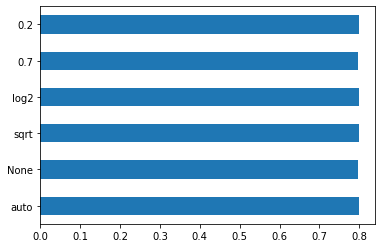

In [34]:
pd.Series(results, max_features_options).plot(kind='barh');

### Min Sample Leafs

In [35]:
results = []
min_samples_leaf_options = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10,20]

In [36]:
for min_samples in min_samples_leaf_options:
    model = RandomForestClassifier(n_estimators=1000, oob_score=True, n_jobs=-1, random_state=42, max_features="auto", min_samples_leaf=min_samples)
    model.fit(X_train, y_train)
    print(min_samples, "min samples")
    auc = model.oob_score_
    print('AUC: ', auc)
    results.append(auc)
    print (" ")
   

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1000,
                       n_jobs=-1, oob_score=True, random_state=42, verbose=0,
                       warm_start=False)

1 min samples
AUC:  0.7991573033707865
 


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=2, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1000,
                       n_jobs=-1, oob_score=True, random_state=42, verbose=0,
                       warm_start=False)

2 min samples
AUC:  0.8216292134831461
 


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=3, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1000,
                       n_jobs=-1, oob_score=True, random_state=42, verbose=0,
                       warm_start=False)

3 min samples
AUC:  0.8188202247191011
 


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=4, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1000,
                       n_jobs=-1, oob_score=True, random_state=42, verbose=0,
                       warm_start=False)

4 min samples
AUC:  0.8286516853932584
 


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=5, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1000,
                       n_jobs=-1, oob_score=True, random_state=42, verbose=0,
                       warm_start=False)

5 min samples
AUC:  0.8258426966292135
 


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=6, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1000,
                       n_jobs=-1, oob_score=True, random_state=42, verbose=0,
                       warm_start=False)

6 min samples
AUC:  0.8174157303370787
 


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=7, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1000,
                       n_jobs=-1, oob_score=True, random_state=42, verbose=0,
                       warm_start=False)

7 min samples
AUC:  0.8132022471910112
 


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=8, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1000,
                       n_jobs=-1, oob_score=True, random_state=42, verbose=0,
                       warm_start=False)

8 min samples
AUC:  0.8117977528089888
 


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=9, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1000,
                       n_jobs=-1, oob_score=True, random_state=42, verbose=0,
                       warm_start=False)

9 min samples
AUC:  0.8103932584269663
 


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=10, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1000,
                       n_jobs=-1, oob_score=True, random_state=42, verbose=0,
                       warm_start=False)

10 min samples
AUC:  0.8075842696629213
 


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=20, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1000,
                       n_jobs=-1, oob_score=True, random_state=42, verbose=0,
                       warm_start=False)

20 min samples
AUC:  0.8047752808988764
 


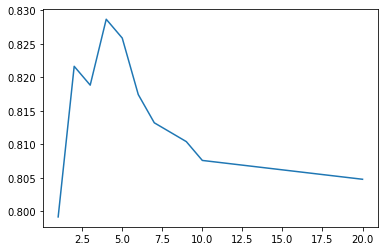

In [37]:
pd.Series(results, min_samples_leaf_options).plot();

# Best Practice for Interpreting Random Forest

# Interpreting Individual trees

In [38]:
# The amount of trees used to ensemble
model_2.estimators_

[DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                        max_features='auto', max_leaf_nodes=None,
                        min_impurity_decrease=0.0, min_impurity_split=None,
                        min_samples_leaf=1, min_samples_split=2,
                        min_weight_fraction_leaf=0.0, presort=False,
                        random_state=1751002438, splitter='best'),
 DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                        max_features='auto', max_leaf_nodes=None,
                        min_impurity_decrease=0.0, min_impurity_split=None,
                        min_samples_leaf=1, min_samples_split=2,
                        min_weight_fraction_leaf=0.0, presort=False,
                        random_state=618510555, splitter='best'),
 DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                        max_features='auto', max_leaf_nodes=None,
                  

### Visualize a single decision tree

In [39]:
Xx = pd.read_csv('titanic_train.csv')
Xx.Survived.value_counts(1)

0    0.616162
1    0.383838
Name: Survived, dtype: float64

In [40]:
X_train.shape

(712, 20)

### Each node in a tree contains:
1. The splitting criteria of the attribute (Sex_male <= 0.5)
2. Has the bootstrap sample (ex. 451/712 --> 67% of the data)
3. Class value of the sample (ex. [448, 264] --> 448 0's, 264 1's)
4. Final class outcome (classification is majority vote, regression is MSE)
5. Cost Function (Gini - used to interpret how good of a split we made)

#### Gini 
- We use the Gini Index as our cost function used to evaluate splits in the dataset.
- A Gini score gives an idea of how good a split is by how mixed the classes are in the two groups created by the split. 
- A perfect separation results in a Gini score of 0 (ex. [0,25])
- Whereas the worst case split that results in 50/50 classes.


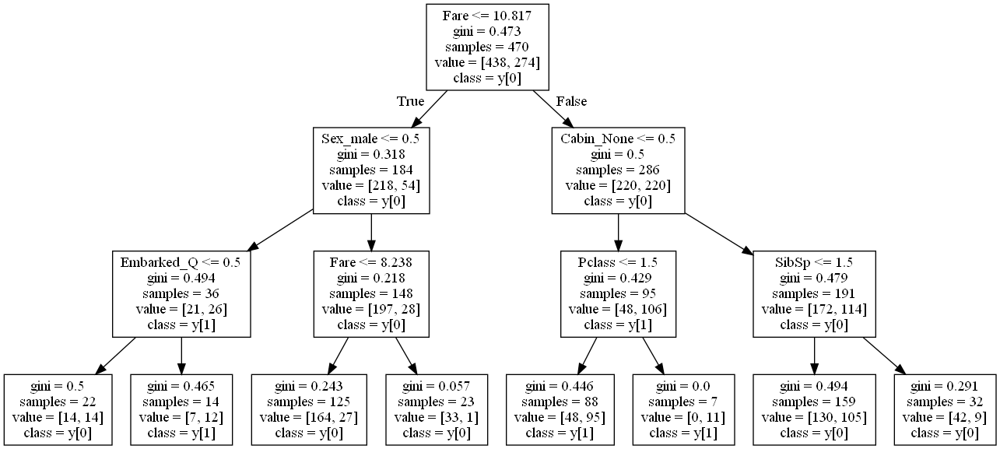

In [41]:
# Load libraries
from sklearn.tree import DecisionTreeClassifier
from sklearn import datasets
from IPython.display import Image  
from sklearn import tree
import pydotplus


m = RandomForestClassifier(n_estimators=1, max_depth=3)
m = m.fit(X_train, y_train)
# Create DOT data
dot_data = tree.export_graphviz(m.estimators_[0], out_file=None, 
                                feature_names=X_train.columns,  
                                class_names=True)

# Draw graph
graph = pydotplus.graph_from_dot_data(dot_data)  

# Show graph
Image(graph.create_png())

### Visualize Entire Decision Tree

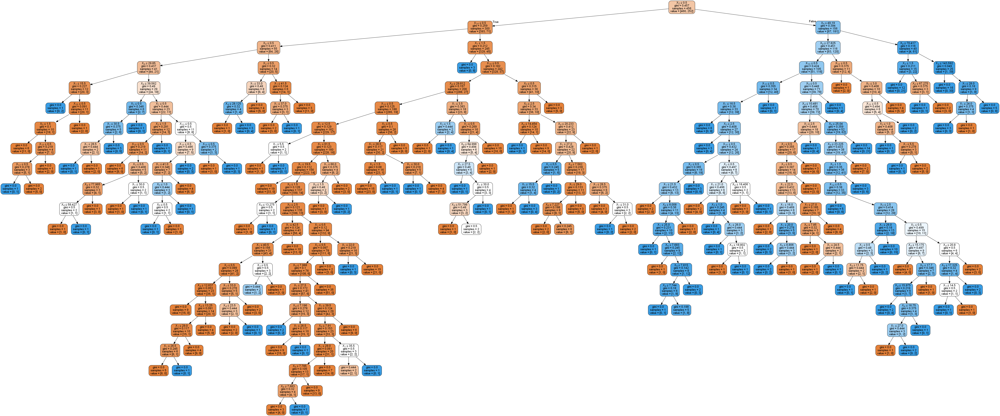

In [42]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(model_2.estimators_[0], out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  

Image(graph.create_png())

# Interpreting Feature Importance

Feature selection  - implicit feature selection whereas models like LASSO is explicit.

A feature’s importance is the increase in the model’s prediction error after we permuted the feature’s values (breaks the relationship between the feature and the outcome).

**What does it mean:** The important features are more correlated with the dependent variable and contribute more variance to the dependent varaible. 

**How does it work:**
1. Train Random Forest Model
2. Find prediction score of model (benchmark score)
3. For each feature, shuffle it's value to alter it and look at prediction performance.
4. Compare it with benchmark score. If the altered feature hurts the score, then it's a bad feature. 

If you work with linear models then there is quite simple distinction if feature is "positive" or "negative", because the only impact it can have on the final result is being added (with weight). Nothing more. However, ensemble of decision trees can have arbitrary complex rules for each feature, for example "if book has red cover and have more than 100 pages then if it contains dragons it gets high score" but "if book has blue cover and more than 100 pages then if it contains dragons it gets low score" and so on.

Feature importance only gives you notion which features contributes to the decision, not "which way", because sometimes it will work this, and sometimes the other way.

In [43]:
model_2.feature_importances_

array([6.80748759e-02, 2.24240737e-01, 6.92844117e-02, 3.76706126e-02,
       2.06602815e-01, 1.52019649e-01, 1.24476553e-01, 2.13730604e-03,
       5.80274670e-03, 1.43312769e-02, 1.11597845e-02, 1.61675035e-02,
       3.77872119e-03, 3.10565152e-03, 2.61347026e-02, 1.52152843e-04,
       1.50912809e-02, 0.00000000e+00, 5.61791538e-03, 1.41513042e-02])

Pclass              0.068075
Age                 0.224241
SibSp               0.069284
Parch               0.037671
Fare                0.206603
Sex_female          0.152020
Sex_male            0.124477
Cabin_A             0.002137
Cabin_B             0.005803
Cabin_C             0.014331
Cabin_D             0.011160
Cabin_E             0.016168
Cabin_F             0.003779
Cabin_G             0.003106
Cabin_None          0.026135
Cabin_T             0.000152
Embarked_C          0.015091
Embarked_Missing    0.000000
Embarked_Q          0.005618
Embarked_S          0.014151
dtype: float64


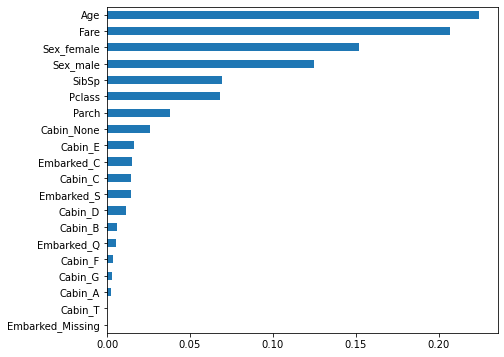

In [44]:
feature_importances = pd.Series(model_2.feature_importances_, index=X.columns)
print(feature_importances)
feature_importances.sort_values(inplace=True)
feature_importances.plot(kind='barh', figsize=(7,6))

### Combine the categorical features into one feature importance

In [50]:
model_2.feature_importances_.max()

0.2242407369320265

In [51]:
# Create function to combine feature importances
def graph_feature_importances(model, feature_names, autoscale=True, headroom=0.1, width=10, summarized_columns=None):  
    feature_dict=dict(zip(feature_names, model.feature_importances_))
    
    if summarized_columns:
        for col_name in summarized_columns:
            sum_value = sum(x for i, x in feature_dict.items() if col_name in i )
            keys_to_remove = [i for i in feature_dict.keys() if col_name in i ]
            for i in keys_to_remove:
                feature_dict.pop(i)
            feature_dict[col_name] = sum_value
    results = pd.Series(feature_dict, index=feature_dict.keys())
    results.sort_values(inplace=True)
    print(results)
    results.plot(kind='barh', figsize=(width, len(results)/4), xlim=(0, .30))
 

Embarked    0.034861
Parch       0.037671
Pclass      0.068075
SibSp       0.069284
Cabin       0.082770
Fare        0.206603
Age         0.224241
Sex         0.276496
dtype: float64


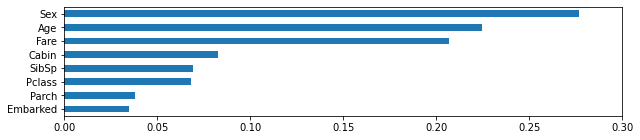

In [52]:
# Create combined feature importances
graph_feature_importances(model_2, X.columns, summarized_columns=categorical_variables)

# Conclusion

**In short:**
- It needs minimal data cleaning
- Works with both regression and classification
- It gives feature importance
- Great for exploratory modeling
- Good baseline model
- Built in cross validation
- Little hyper parameter tuning
- Treats different scaling of features similarly
- Natively detects non linear interactions